## What Do Outlier Positions Encode?

We've established that position 193 is:
- An outlier within images (dissimilar to other positions)
- Consistent across images (0.91 similarity)

**Question:** What does it actually encode? Can we interpret or manipulate it?

In [1]:
import sys

sys.path.append("..")

import duckdb
import numpy as np
import torch
import seaborn as sns
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

from vlm_tools import load_model_and_processor

sns.set_theme(style="dark", font="JetBrains Mono")

In [2]:
model, processor = load_model_and_processor()
conn = duckdb.connect("open_images/open_images_embeddings.db")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


### Approach 1: Unembedding

Project the position 193 centroid through the language model head to see what vocabulary tokens it maps to.

In [3]:
# Get position 193 embeddings from 193-outlier images
def get_outlier_position(image_id: str, conn) -> int:
    df = conn.sql(f"""
        SELECT token_position, embedding_vector 
        FROM image_token_embeddings 
        WHERE image_id = '{image_id}'
        ORDER BY token_position
    """).df()
    embeddings = np.stack(df["embedding_vector"].values)
    sim_matrix = cosine_similarity(embeddings, embeddings)
    return int(np.argmin(sim_matrix.mean(axis=0)))


image_ids = (
    conn.sql("SELECT DISTINCT image_id FROM image_token_embeddings")
    .df()
    .image_id.tolist()
)
bucket_193 = [
    img_id for img_id in image_ids[:1000] if get_outlier_position(img_id, conn) == 193
]

# Extract position 193 embeddings
id_list = ", ".join([f"'{img_id}'" for img_id in bucket_193])
df = conn.sql(f"""
    SELECT embedding_vector
    FROM image_token_embeddings
    WHERE image_id IN ({id_list})
    AND token_position = 193
""").df()

pos_193_embeddings = np.stack(df["embedding_vector"].values)
centroid_193 = pos_193_embeddings.mean(axis=0)
direction_193 = centroid_193 / np.linalg.norm(centroid_193)

print(f"Computed centroid from {len(bucket_193)} images")
print(f"Centroid norm: {np.linalg.norm(centroid_193):.2f}")

Computed centroid from 961 images
Centroid norm: 58.98


In [4]:
def unembed(embedding: np.ndarray, top_k: int = 10):
    """Project embedding through lm_head to vocabulary."""
    emb = torch.tensor(embedding, dtype=torch.bfloat16).unsqueeze(0).to("mps")
    logits = model.lm_head(emb)
    probs = torch.softmax(logits, dim=-1)
    top_probs, top_ids = torch.topk(probs.squeeze(), top_k)

    for prob, tid in zip(top_probs, top_ids):
        token = processor.tokenizer.decode(tid.item())
        print(f"{repr(token):>20}: {prob.item():.4f}")

In [5]:
print("Position 193 centroid unembeds to:")
print("-" * 30)
unembed(centroid_193)

Position 193 centroid unembeds to:
------------------------------
                 ' ': 0.0442
                 '�': 0.0016
             '<bos>': 0.0015
      'ProguardFile': 0.0009
           'tooltip': 0.0005
         ' eclectic': 0.0003
           'alassem': 0.0003
                '首页': 0.0003
            'liğini': 0.0002
            'itario': 0.0002


The centroid maps to whitespace, garbage tokens, and random Unicode. **Unembedding doesn't reveal semantic meaning.**

### Approach 2: Steering

If we can't read what it encodes, can we understand its function by manipulating it?

- `alpha = 1.0`: baseline (no change)
- `alpha = 0.0`: remove the direction entirely
- `alpha = -1.0`: flip the direction

In [6]:
def generate_with_steering(
    image: Image.Image,
    prompt: str,
    direction: np.ndarray,
    position: int = 193,
    alpha: float = 1.0,
    max_new_tokens: int = 256,
) -> str:
    """
    Generate with directional steering at a specific position.

    alpha = 1.0: identity (no change)
    alpha = 0.0: remove direction component
    alpha = -1.0: flip direction component
    """
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": prompt},
            ],
        },
    ]

    inputs = processor.apply_chat_template(
        messages,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
        add_generation_prompt=True,
    ).to("mps")

    with torch.no_grad():
        image_features = model.vision_tower(inputs.pixel_values)
        image_tokens = model.multi_modal_projector(image_features[0]).clone()

        # Steering
        d = torch.tensor(
            direction, dtype=image_tokens.dtype, device=image_tokens.device
        )
        emb = image_tokens[0, position, :]

        proj_scalar = torch.dot(emb, d)
        proj_vector = proj_scalar * d
        residual = emb - proj_vector

        image_tokens[0, position, :] = residual + alpha * proj_vector

        # Combine with text embeddings
        text_embeds = model.get_input_embeddings()(inputs.input_ids)
        image_token_id = 262144
        seq_idx = (
            (inputs.input_ids == image_token_id).nonzero(as_tuple=True)[1][0].item()
        )

        combined_embeds = torch.cat(
            [
                text_embeds[:, :seq_idx, :],
                image_tokens,
                text_embeds[:, seq_idx + 1 :, :],
            ],
            dim=1,
        )

        combined_mask = torch.cat(
            [
                inputs.attention_mask[:, :seq_idx],
                torch.ones(1, 256, device="mps", dtype=inputs.attention_mask.dtype),
                inputs.attention_mask[:, seq_idx + 1 :],
            ],
            dim=1,
        )

        outputs = model.generate(
            inputs_embeds=combined_embeds,
            attention_mask=combined_mask,
            max_new_tokens=max_new_tokens,
            do_sample=False,
        )

    return processor.tokenizer.decode(outputs[0], skip_special_tokens=True)

In [7]:
def run_steering_experiment(
    image: Image.Image,
    prompt: str,
    direction: np.ndarray,
    alphas: list[float] = [1.0, -1.0],
    position: int = 193,
    max_chars: int = 500,
    labels: dict[float, str] | None = None,
):
    """Run steering experiment across alpha values with formatted output."""
    default_labels = {
        1.0: "baseline",
        0.0: "remove direction",
        -1.0: "flip direction",
    }
    labels = labels or default_labels

    for alpha in alphas:
        label = labels.get(alpha, f"α={alpha}")
        print(f"\n{'=' * 60}")
        print(f"α = {alpha} ({label})")
        print("=" * 60)

        output = generate_with_steering(
            image, prompt, direction, position=position, alpha=alpha
        )
        print(output[:max_chars] + "..." if len(output) > max_chars else output)

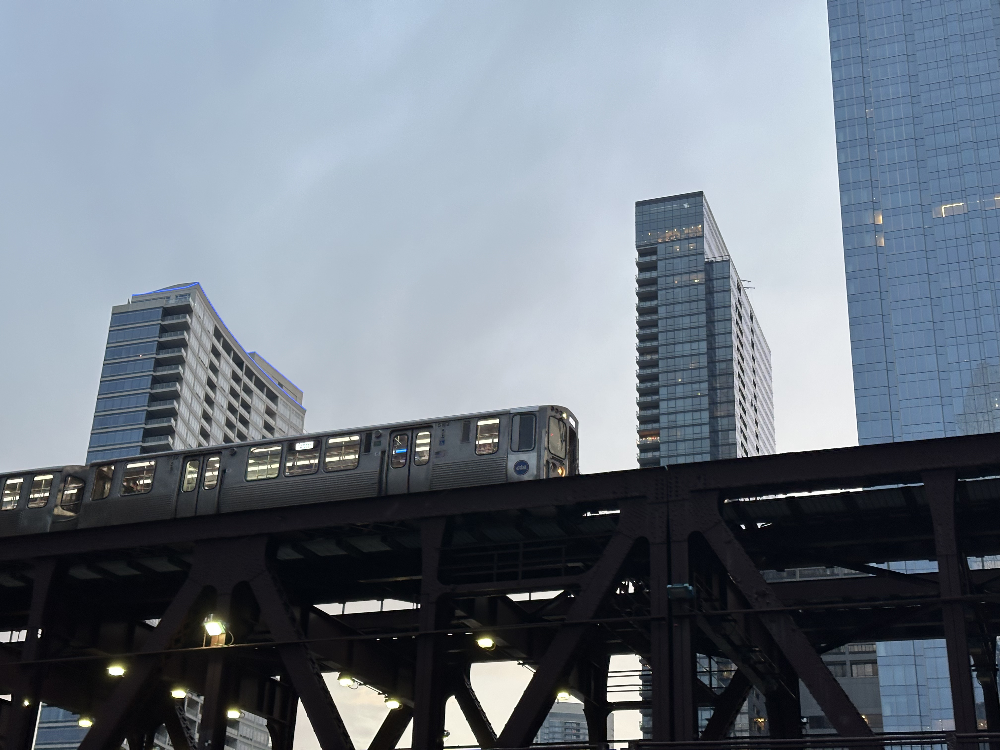

In [8]:
test_image = Image.open("../video/images/chicago_l.jpg")
test_image

### Experiment: "What city is this?"

In [9]:
run_steering_experiment(
    test_image,
    "What city is this?",
    direction_193,
    alphas=[1.0, 0.0, -1.0],
)


α = 1.0 (baseline)


The following generation flags are not valid and may be ignored: ['top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Based on the image, this is likely **Chicago, Illinois**. 

Here's how I came to that conclusion:

*   **The architecture:** The tall, modern skyscrapers with glass facades are characteristic of Chicago's downtown area.
*   **The elevated train tracks:** Chicago is famous for its extensive elevated train system (the "L").
*   **The overall urban feel:** The combination of the skyscrapers and the train tracks is a very typical Chicago scene.

Let me know if you'd like me to elaborate on any of th...

α = 0.0 (remove direction)
Based on the image, this is likely **Chicago, Illinois**. 

Here's how I came to that conclusion:

*   **The architecture:** The tall, modern skyscrapers with glass facades are characteristic of Chicago's downtown area.
*   **The elevated train tracks:** Chicago is famous for its extensive elevated "L" train system.
*   **The overall urban feel:** The combination of the skyscrapers and the train tracks is a very typical Chicago scene.

Let me know if you'd like me

### Key Finding

- **Baseline (α=1)**: Identifies Chicago, explains reasoning
- **Remove (α=0)**: Still identifies Chicago correctly
- **Flip (α=-1)**: Sees the image but loses the ability to answer the question

### Experiment: Instruction Following

Does flipping position 193 affect the model's ability to follow specific instructions?

In [10]:
run_steering_experiment(
    test_image,
    "List exactly 3 things you see in this image. No more, no less.",
    direction_193,
)


α = 1.0 (baseline)
Here are 3 things I see in the image:

1.  Train
2.  Bridge
3.  Skyscrapers

α = -1.0 (flip direction)
Okay, here's a description of the image:

The image shows a photograph of a subway train passing through a city street. The train is a silver-colored subway train, with a few passengers visible inside. The train is moving along a dark-colored elevated track, and the background is a cityscape with tall buildings and a cloudy sky. The image is taken from a low angle, looking up at the train.


In [11]:
run_steering_experiment(
    test_image,
    "What type of transportation is shown? Answer in exactly one word.",
    direction_193,
)


α = 1.0 (baseline)
Train

α = -1.0 (flip direction)
Urban 



In [12]:
run_steering_experiment(
    test_image,
    "Is there a train in this image? Answer only yes or no.",
    direction_193,
)


α = 1.0 (baseline)
Yes.

α = -1.0 (flip direction)
No.


### Control: Is Position 193 Special?

What if we flip a different position using the same direction?

In [13]:
prompt = "What city is this?"

for position in [193, 100, 50]:
    print(f"\n{'=' * 60}")
    print(f"Flipping position {position} (alpha=-1)")
    print("=" * 60)

    output = generate_with_steering(
        test_image, prompt, direction_193, position=position, alpha=-1.0
    )
    print(output[:400] + "..." if len(output) > 400 else output)


Flipping position 193 (alpha=-1)
Okay, let's me.

Here's a description of the image:

The image shows a photograph of a train passing over a bridge. The train is a silver-colored subway train, and the bridge is a steel structure with a dark gray sky above. The train is moving across the bridge, and the sky is overcast and gray. The train is moving along a steel bridge with a dark gray sky above. The train is moving along a steel ...

Flipping position 100 (alpha=-1)
Based on the image, this is likely **Chicago, Illinois**. 

Here's how I came to that conclusion:

*   **The architecture:** The tall, modern skyscrapers with glass facades are characteristic of Chicago's downtown area.
*   **The elevated train tracks:** Chicago is famous for its extensive elevated "L" train system.
*   **The overall urban feel:** The combination of the skyscrapers and the train t...

Flipping position 50 (alpha=-1)
Based on the image, this is likely **Chicago, Illinois**. 

Here's how I came to that concl

### Conclusion

Position 193:
- **Unembeds to garbage** - no interpretable semantic content
- **Flipping it breaks reasoning** - while perception remains intact
- **The effect is position-specific** - flipping other positions doesn't break things

We don't know *what* position 193 encodes, but we know it matters for reasoning about visual content.